### Lendo dados e importando bibliotecas

In [1]:
from pandas import read_csv, read_excel, crosstab

from scipy.stats import shapiro, kruskal, chi2_contingency

from numpy import sqrt

from statistics_functions import *

import statsmodels.api as sm

import statsmodels.formula.api as smf


df = read_csv('../Data/ReadyToUse2_Sintomas Musculoesqueléticos em Universitários - Respostas ao formulário 1.csv', sep = ",", encoding = 'latin1', engine = 'python', thousands = '.', decimal = ',')

In [2]:
print(ordinal_inverse_mappings)

df.head(3)

{'Quanto você se preocupou com a sua dor ou com o desconforto físico?  ': {1: 'Nada', 2: 'Muito pouco', 3: 'Mais ou menos', 4: 'Bastante', 5: 'Extremamente'}, 'Quanto você se preocupou com a sua saúde?  ': {1: 'Nada', 2: 'Muito pouco', 3: 'Mais ou menos', 4: 'Bastante', 5: 'Extremamente'}, 'Em que medida você acha que a sua dor (física) te impede de fazer o que precisa?  ': {1: 'Nada', 2: 'Muito pouco', 3: 'Mais ou menos', 4: 'Bastante', 5: 'Extremamente'}, 'Você tem alguma dificuldade para dormir ou dificuldade com o sono?   ': {1: 'Nada', 2: 'Muito pouco', 3: 'Mais ou menos', 4: 'Bastante', 5: 'Extremamente'}, 'Em que medida você tem dificuldade para exercer suas atividades diárias?  ': {1: 'Nada', 2: 'Muito pouco', 3: 'Mais ou menos', 4: 'Bastante', 5: 'Extremamente'}, 'Qual a sua frequência de atividades físicas semanais?  ': {1: 'Nada', 2: '1 a 2 dias', 3: '3 a 4 dias', 4: '5 a 6 dias', 5: 'Todos os dias'}, 'Com que frequência você utiliza dispositivos eletrônicos?   ': {1: 'Nada'

,IDADE,CURSO,SEXO,ESTADO CIVIL,RAÇA/COR DA PELE,RENDA FAMILIAR,Quanto você se preocupou com a sua dor ou com o desconforto físico?,Quanto você se preocupou com a sua saúde?,Em que medida você acha que a sua dor (física) te impede de fazer o que precisa?,Você tem alguma dificuldade para dormir ou dificuldade com o sono?,Em que medida você tem dificuldade para exercer suas atividades diárias?,Qual a sua frequência de atividades físicas semanais?,Com que frequência você utiliza dispositivos eletrônicos?,Você fica sentado estudando em média quantas horas por dia?,As suas atividades acadêmicas/estágios influenciam nas dores que sente?,Você se sente muito estressado/ansioso?,Afirmação de dormência ou formigamento sentidos nos últimos 6 mêses,"Não realização de lazer, atividades domésticas ou trabalho por formigamento ou dormência sentidos nos últimos 6 mêses",Afirmação de consulta com profissionais da saúde por causa das condições de dormência ou formigamento,Afirmação de sintoma musculoesquelético nos últimos 7 dias
0,26,Psicologia,FEMININO,SOLTEIRO (A),PARDA,1-5 SALÁRIOS-MÍNIMOS,3,3,4,3,3,1,5,2,2,4,2,2,1,2
1,43,Psicologia,FEMININO,CASADO (A) /UNIÃO ESTÁVEL,BRANCA,MAIOR QUE 10 SALÁRIOS-MÍNIMOS,3,3,2,5,3,1,4,3,4,4,2,1,1,2
2,25,Psicologia,FEMININO,SOLTEIRO (A),PARDA,1-5 SALÁRIOS-MÍNIMOS,2,4,3,5,3,1,5,3,3,5,2,1,1,2


In [3]:
df.columns

Index(['IDADE', 'CURSO', 'SEXO', 'ESTADO CIVIL', 'RAÇA/COR DA PELE',
       'RENDA FAMILIAR',
       'Quanto você se preocupou com a sua dor ou com o desconforto físico?  ',
       'Quanto você se preocupou com a sua saúde?  ',
       'Em que medida você acha que a sua dor (física) te impede de fazer o que precisa?  ',
       'Você tem alguma dificuldade para dormir ou dificuldade com o sono?   ',
       'Em que medida você tem dificuldade para exercer suas atividades diárias?  ',
       'Qual a sua frequência de atividades físicas semanais?  ',
       'Com que frequência você utiliza dispositivos eletrônicos?   ',
       'Você fica sentado estudando em média quantas horas por dia? ',
       'As suas atividades acadêmicas/estágios influenciam nas dores que sente? ',
       'Você se sente muito estressado/ansioso? ',
       'Afirmação de dormência ou formigamento sentidos nos últimos 6 mêses',
       'Não realização de lazer, atividades domésticas ou trabalho por formigamento ou dormênc

### Gerando análise associativa entre bem estar e sintomas à partir de box-plots

In [4]:

df.columns
# analyze_ordinal_pair(df,
#                     'Com que frequência você utiliza dispositivos eletrônicos?   ',
#                     'Não realização de lazer, atividades domésticas ou trabalho por formigamento ou dormência sentidos nos últimos 6 mêses'
#                     )

Index(['IDADE', 'CURSO', 'SEXO', 'ESTADO CIVIL', 'RAÇA/COR DA PELE',
       'RENDA FAMILIAR',
       'Quanto você se preocupou com a sua dor ou com o desconforto físico?  ',
       'Quanto você se preocupou com a sua saúde?  ',
       'Em que medida você acha que a sua dor (física) te impede de fazer o que precisa?  ',
       'Você tem alguma dificuldade para dormir ou dificuldade com o sono?   ',
       'Em que medida você tem dificuldade para exercer suas atividades diárias?  ',
       'Qual a sua frequência de atividades físicas semanais?  ',
       'Com que frequência você utiliza dispositivos eletrônicos?   ',
       'Você fica sentado estudando em média quantas horas por dia? ',
       'As suas atividades acadêmicas/estágios influenciam nas dores que sente? ',
       'Você se sente muito estressado/ansioso? ',
       'Afirmação de dormência ou formigamento sentidos nos últimos 6 mêses',
       'Não realização de lazer, atividades domésticas ou trabalho por formigamento ou dormênc

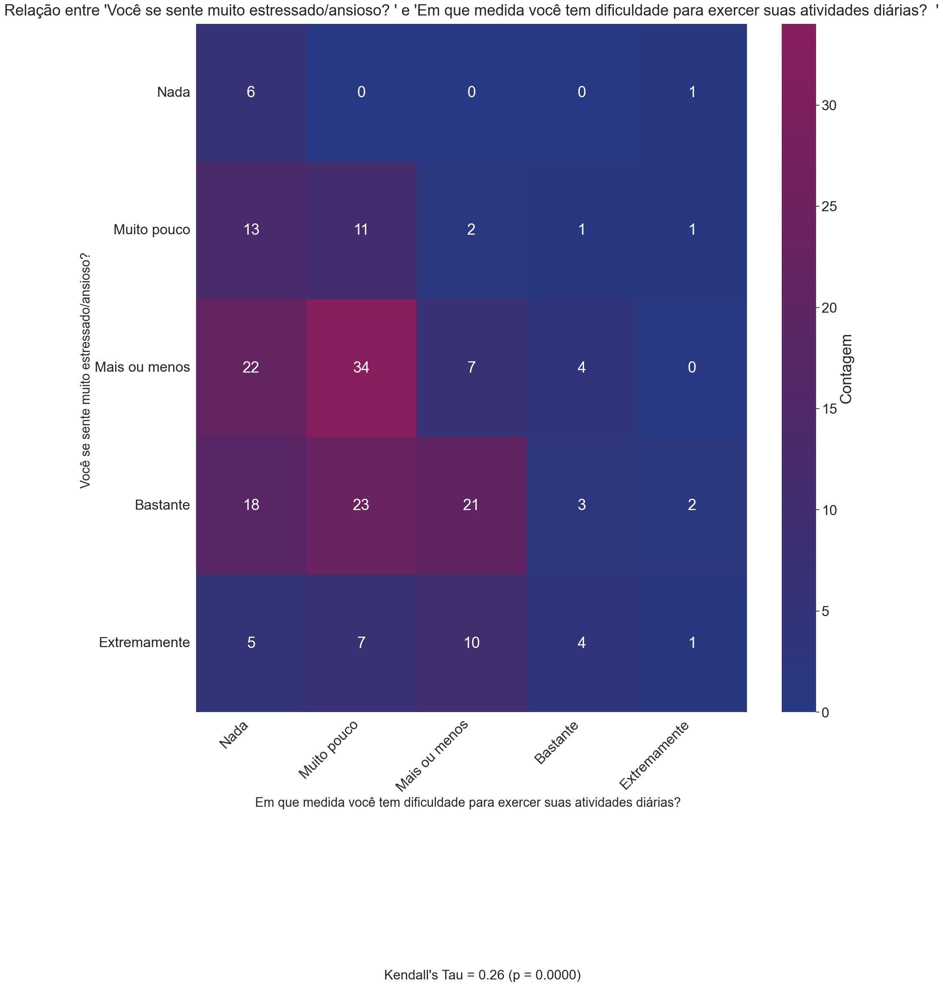

In [5]:
analyze_ordinal_pair(df,
                    'Você se sente muito estressado/ansioso? ',
                    'Em que medida você tem dificuldade para exercer suas atividades diárias?  '
                    )

### Analisando correlação para cada um dos casos:

In [6]:
df['As suas atividades acadêmicas/estágios influenciam nas dores que sente? '].unique().tolist()

[2, 4, 3, 1, 5]

In [7]:

lista_perguntas_sintomaticas = [
    'As suas atividades acadêmicas/estágios influenciam nas dores que sente? ',
    'Afirmação de dormência ou formigamento sentidos nos últimos 6 mêses',
    'Não realização de lazer, atividades domésticas ou trabalho por formigamento ou dormência sentidos nos últimos 6 mêses',
    'Afirmação de consulta com profissionais da saúde por causa das condições de dormência ou formigamento',
    'Afirmação de sintoma musculoesquelético nos últimos 7 dias',
]

lista_perguntas_bem_estar = [
    'Quanto você se preocupou com a sua dor ou com o desconforto físico?  ',
    'Quanto você se preocupou com a sua saúde?  ',
    'Em que medida você acha que a sua dor (física) te impede de fazer o que precisa?  ',
    'Você tem alguma dificuldade para dormir ou dificuldade com o sono?   ',
    'Em que medida você tem dificuldade para exercer suas atividades diárias?  ',
    'Qual a sua frequência de atividades físicas semanais?  ',
    'Com que frequência você utiliza dispositivos eletrônicos?   ',
    'Você fica sentado estudando em média quantas horas por dia? ',
    'Você se sente muito estressado/ansioso? '
]

lista_socioeconom = [
    'Idade',
    'CURSO',
    'ESTADO CIVIL',
    'RENDA FAMILIAR',
    
]

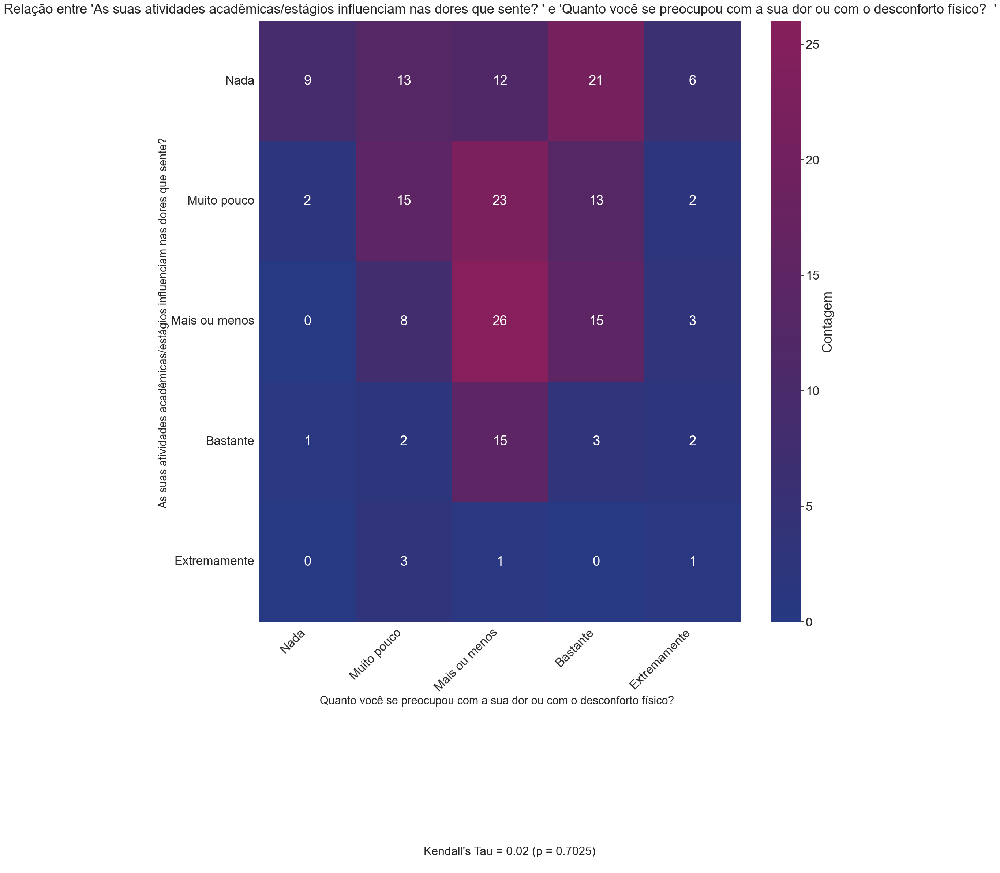

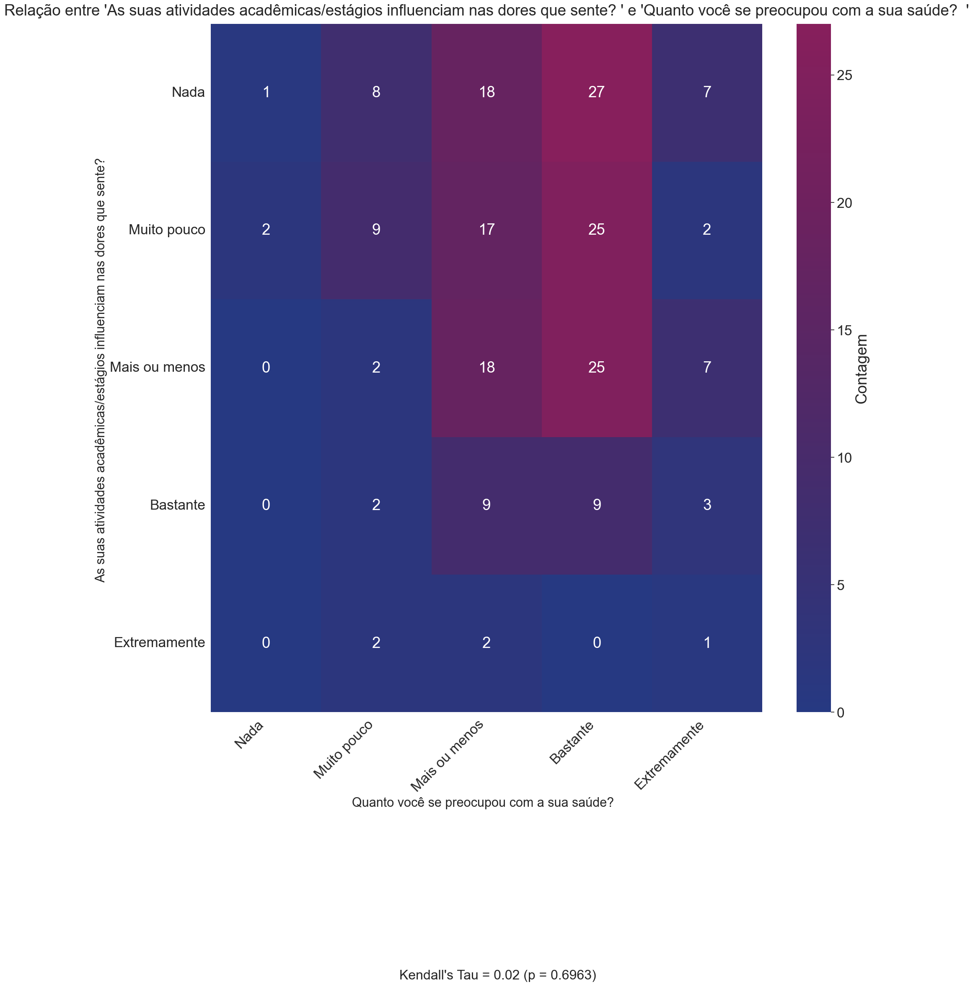

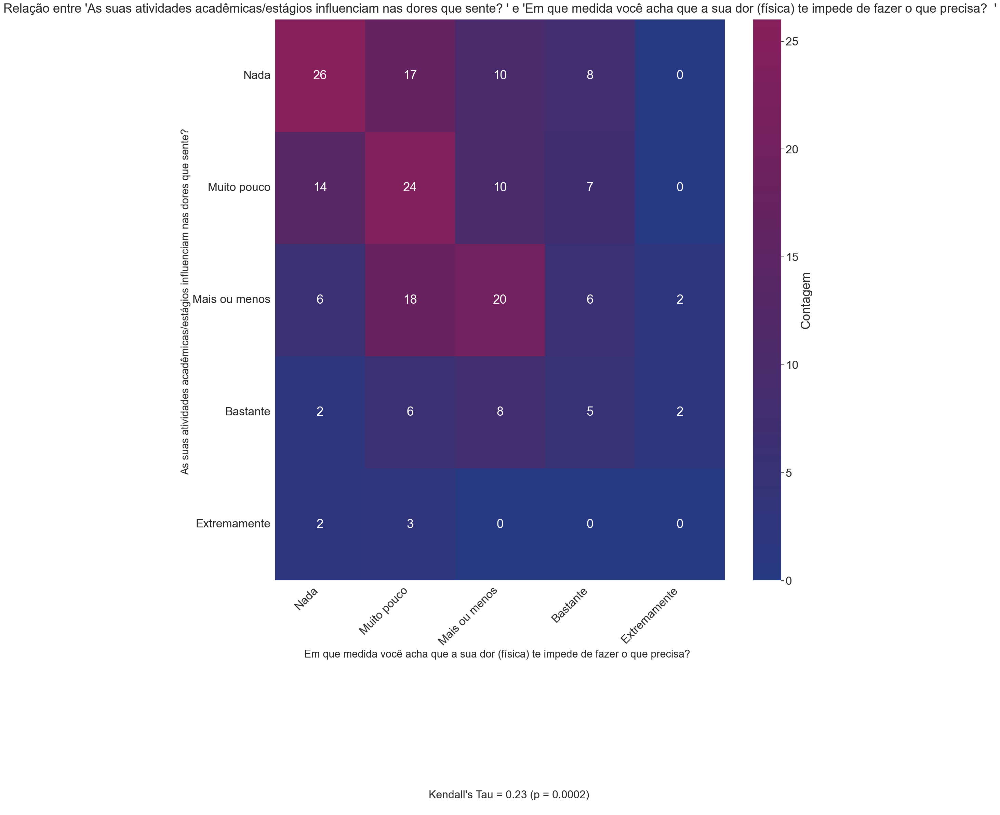

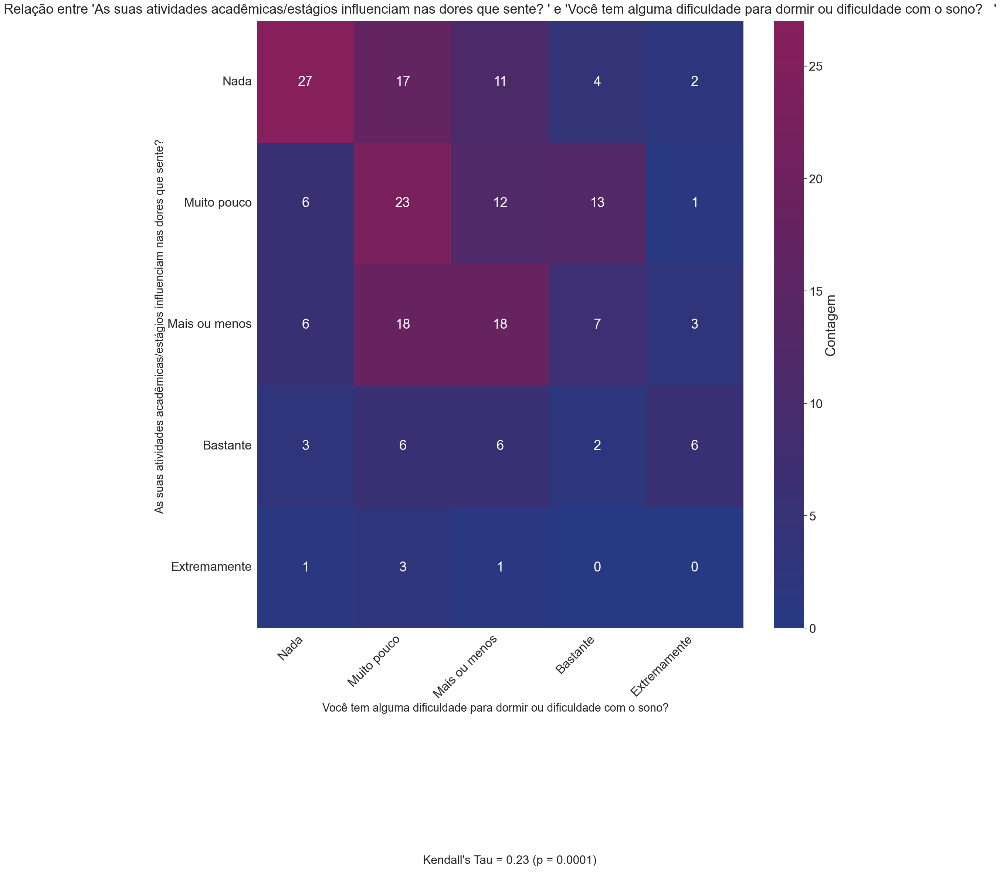

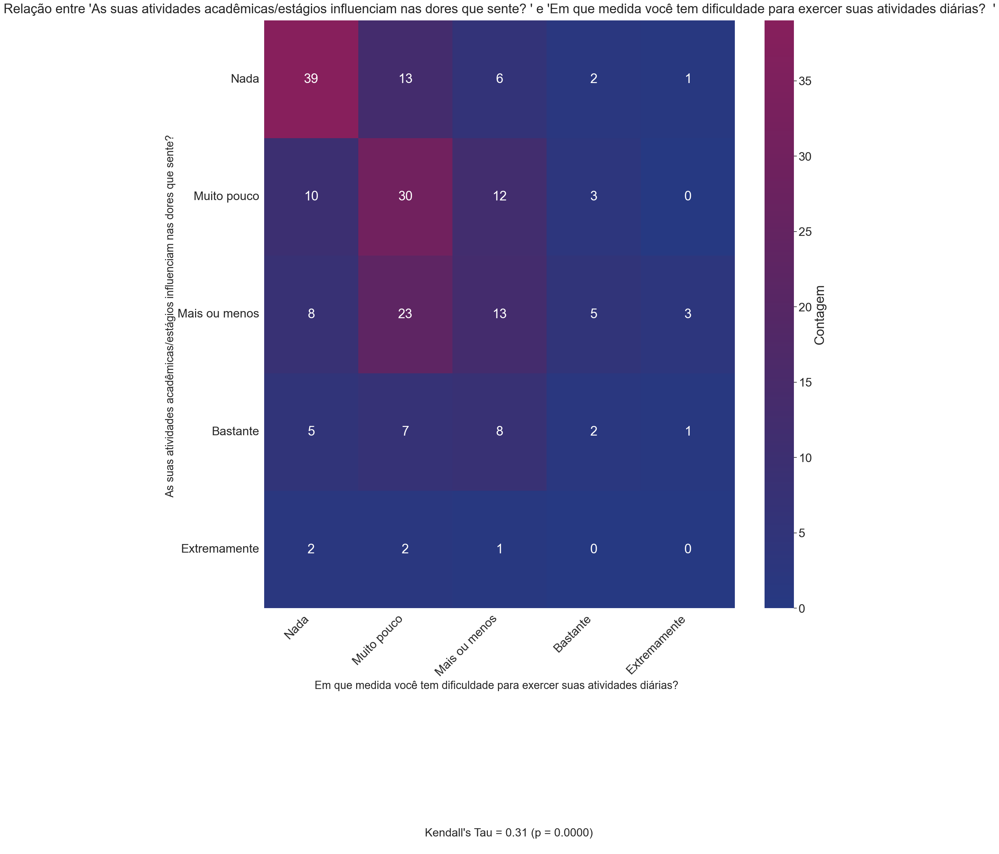

...

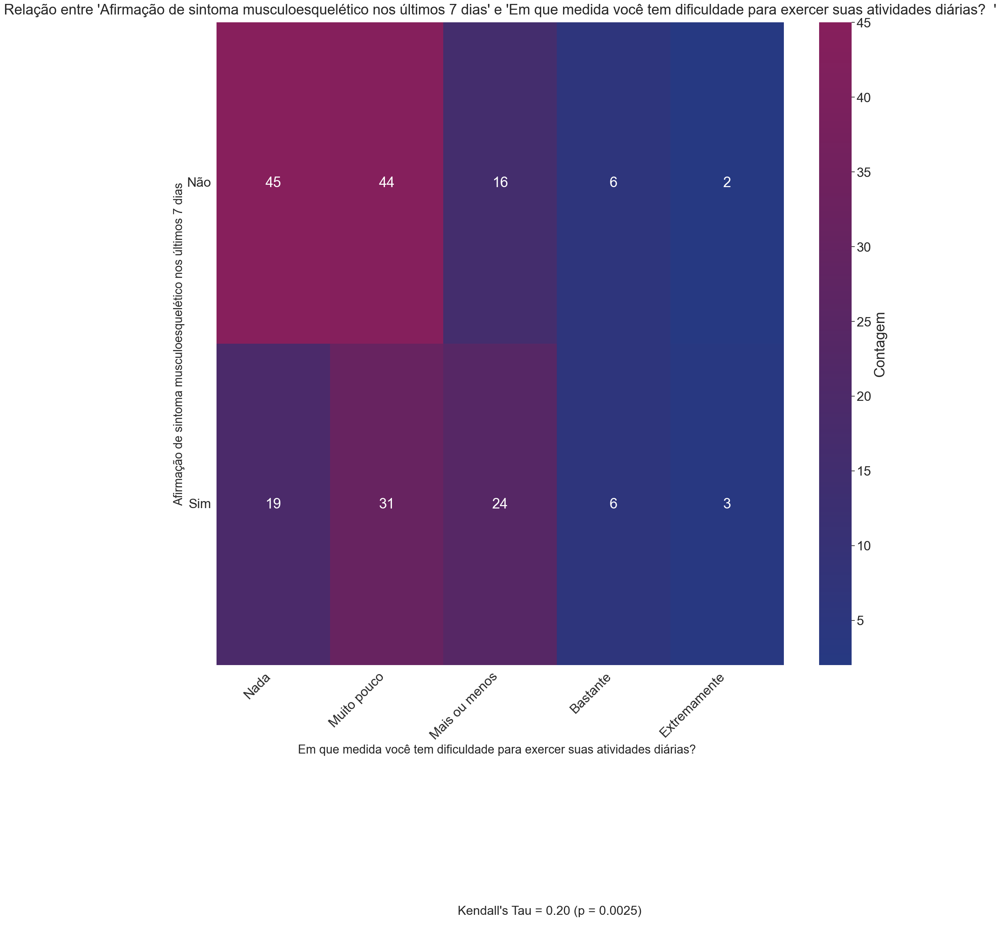

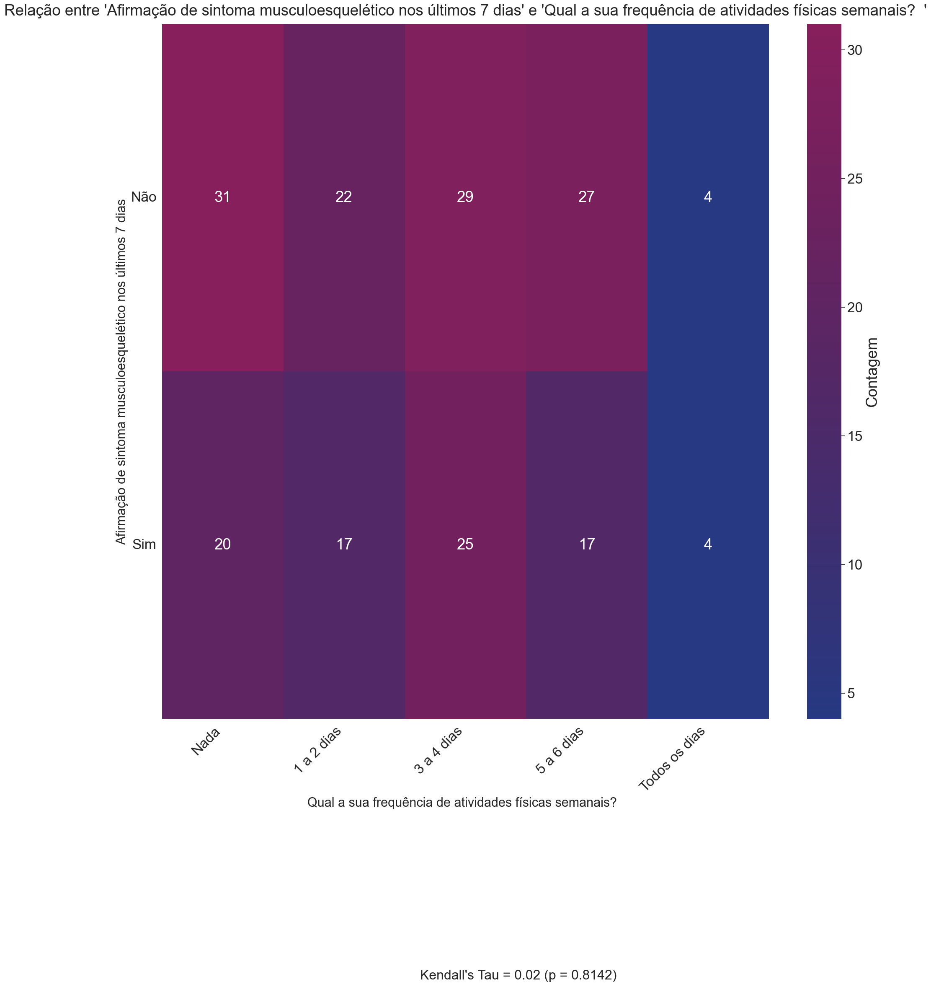

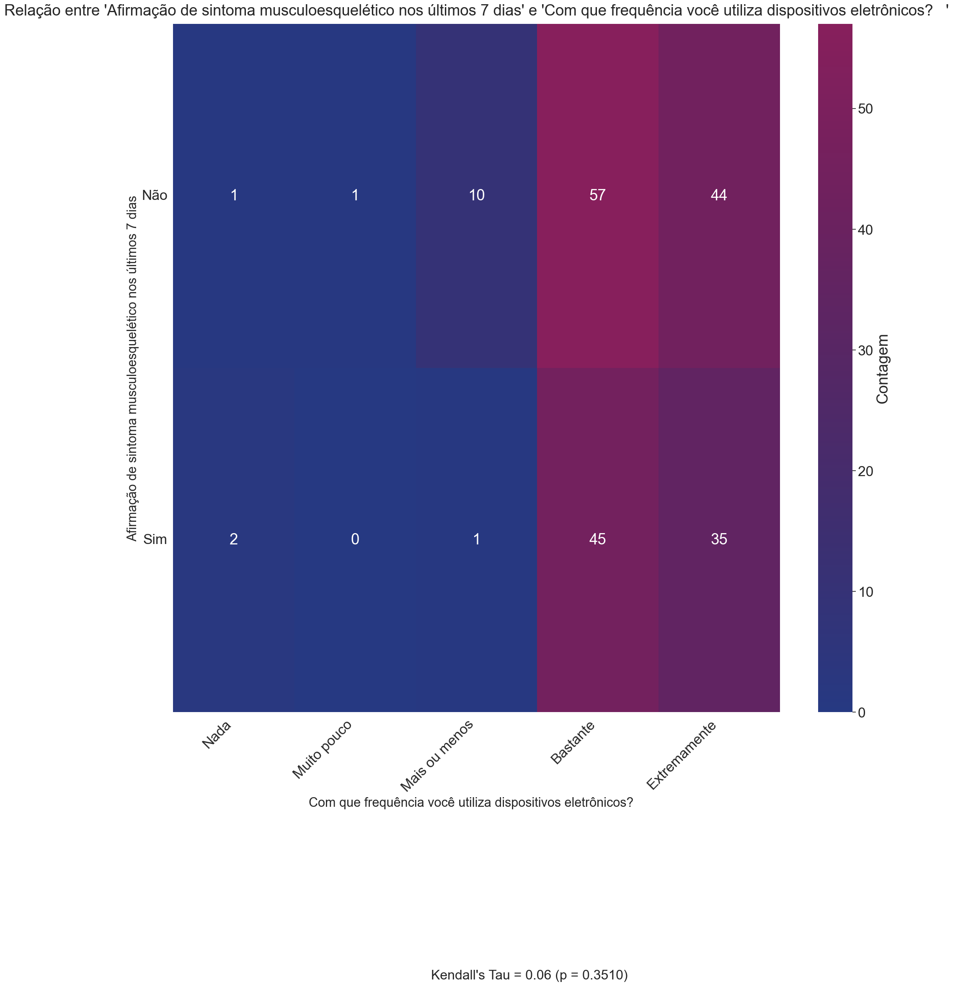

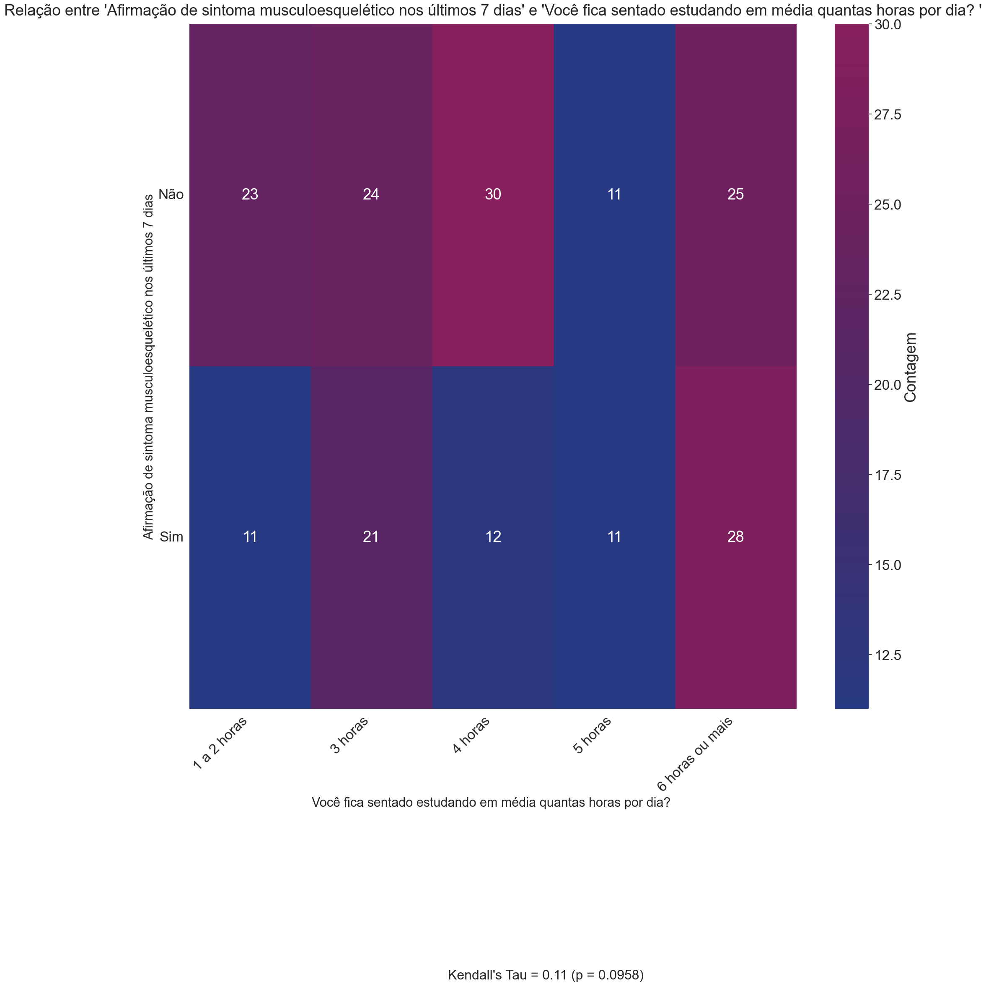

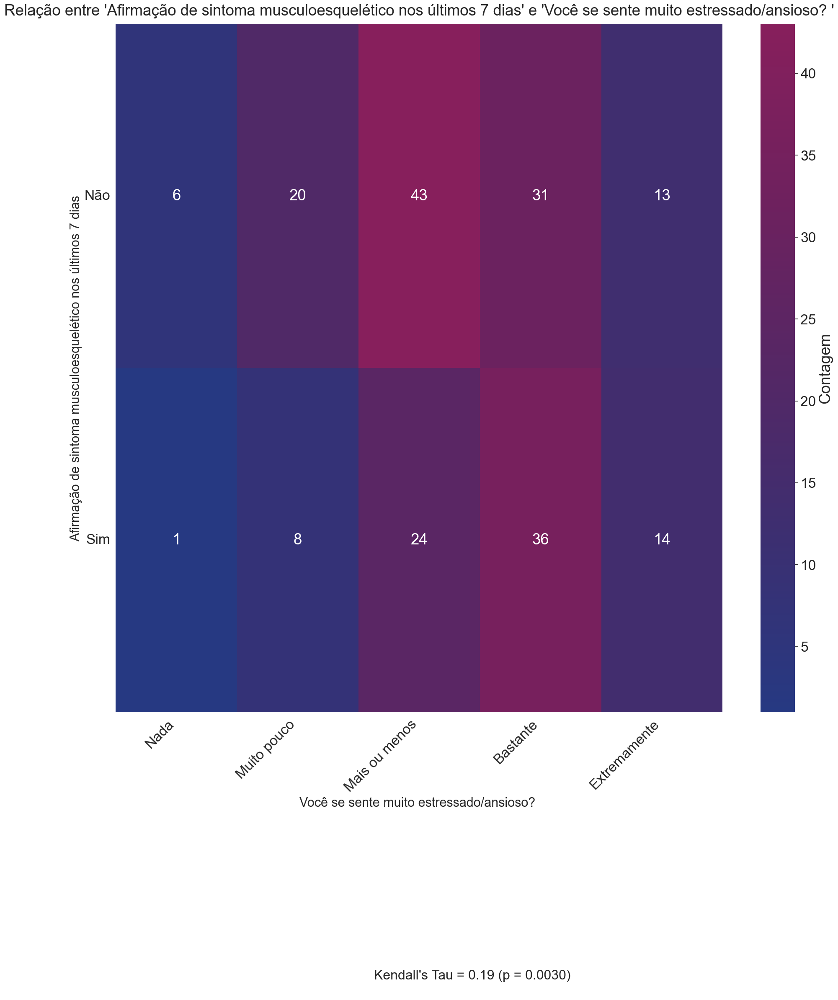

In [8]:
for sintoma in lista_perguntas_sintomaticas:
    for bem_estar in lista_perguntas_bem_estar:
        analyze_ordinal_pair(df, sintoma, bem_estar)

In [9]:
import pandas as pd
import numpy as np

def generate_complete_descriptive_table(df):
    """
    Gera tabela descritiva em LaTeX com:
    - IQR e Desvio Quartil
    - Estatísticas adaptadas por tipo de variável
    """
    
    legend_mapping = {
        # Dados Demográficos
        "D1": "IDADE",
        "D2": "CURSO",
        "D3": "SEXO",
        "D4": "ESTADO CIVIL", 
        "D5": "RAÇA/COR DA PELE",
        "D6": "RENDA FAMILIAR",
        
        # Bem-Estar (Ordinais)
        "PB1": "Quanto você se preocupou com a sua dor ou com o desconforto físico?  ",
        "PB2": "Quanto você se preocupou com a sua saúde?  ",
        "PB3": "Em que medida você acha que a sua dor (física) te impede de fazer o que precisa?  ",
        "PB4": "Você tem alguma dificuldade para dormir ou dificuldade com o sono?   ",
        "PB5": "Em que medida você tem dificuldade para exercer suas atividades diárias?  ",
        "PB6": "Qual a sua frequência de atividades físicas semanais?  ",
        "PB7": "Com que frequência você utiliza dispositivos eletrônicos?   ",
        "PB8": "Você fica sentado estudando em média quantas horas por dia? ",
        "PB9": "As suas atividades acadêmicas/estágios influenciam nas dores que sente? ",
        "PB10": "Você se sente muito estressado/ansioso? ",
        
        # Sintomas (Ordinais)
        "PS1": "Afirmação de dormência ou formigamento sentidos nos últimos 6 mêses",
        "PS2": "Não realização de lazer, atividades domésticas ou trabalho por formigamento ou dormência sentidos nos últimos 6 mêses",
        "PS3": "Afirmação de consulta com profissionais da saúde por causa das condições de dormência ou formigamento",
        "PS4": "Afirmação de sintoma musculoesquelético nos últimos 7 dias"
    }

    # Verificar correspondência de colunas
    missing_cols = [col for col in df.columns if col not in legend_mapping.values()]
    if missing_cols:
        raise ValueError(f"Colunas não mapeadas: {missing_cols}")

    # Configurar tabela LaTeX
    latex_content = [
        r"\begin{tabular}{|l|c|c|c|c|c|c|c|c|c|c|c|c|}",
        r"\hline",
        r"Variável & Tipo & N & Moda & Mín & Máx & Q1 & Q3 & \textbf{IQR} & \textbf{Desvio Quartil} & Média & Mediana & DP \\",
        r"\hline"
    ]

    # Processar cada coluna
    for full_question in df.columns:
        short_code = [k for k, v in legend_mapping.items() if v == full_question][0]
        
        # Determinar tipo de variável
        if short_code.startswith(('PB', 'PS')):
            var_type = "Ordinal"
        elif short_code == 'D1':
            var_type = "Numérica"
        else:
            var_type = "Categórica"
        
        n = df[full_question].count()
        mode = df[full_question].mode().values
        mode_str = ", ".join(map(str, mode)) if len(mode) > 0 else "-"

        # Calcular estatísticas por tipo
        if var_type == "Numérica":
            q1 = round(df[full_question].quantile(0.25), 2)
            q3 = round(df[full_question].quantile(0.75), 2)
            iqr = round(q3 - q1, 2)
            qd = round(iqr / 2, 2)
            
            stats = [
                df[full_question].min(),
                df[full_question].max(),
                q1,
                q3,
                iqr,
                qd,
                round(df[full_question].mean(), 2),
                round(df[full_question].median(), 2),
                round(df[full_question].std(), 2)
            ]
            row = f"{short_code} & {var_type} & {n} & {mode_str} & {stats[0]} & {stats[1]} & {stats[2]} & {stats[3]} & {stats[4]} & {stats[5]} & {stats[6]} & {stats[7]} & {stats[8]} \\\\"
        
        elif var_type == "Ordinal":
            q1 = round(df[full_question].quantile(0.25), 2)
            q3 = round(df[full_question].quantile(0.75), 2)
            iqr = round(q3 - q1, 2)
            qd = round(iqr / 2, 2)
            
            stats = [
                df[full_question].min(),
                df[full_question].max(),
                q1,
                q3,
                iqr,
                qd
            ]
            row = f"{short_code} & {var_type} & {n} & {mode_str} & {stats[0]} & {stats[1]} & {stats[2]} & {stats[3]} & {stats[4]} & {stats[5]} & - & - & - \\\\"
        
        else:  # Categórica
            row = f"{short_code} & {var_type} & {n} & {mode_str} & - & - & - & - & - & - & - & - & - \\\\"

        latex_content.append(row)
        latex_content.append(r"\hline")

    # Finalizar tabela
    latex_content.extend([
        r"\end{tabular}",
        r"\vspace{0.5cm}",
        r"\begin{footnotesize}",
        r"\textbf{Notas:}",
        r"\begin{itemize}",
        r"\item IQR = Q3 - Q1; Desvio Quartil = IQR/2",
        r"\item Para variáveis ordinais, Q1/Q3 são calculados sobre valores codificados (ex: 1-5)",
        r"\item Média/Mediana/DP não são reportadas para ordinais por limitações metodológicas",
        r"\end{itemize}",
        r"\textbf{Legenda detalhada:}\\"
    ])
    
    for code, question in legend_mapping.items():
        latex_content.append(fr"{code}: {question}\\")
    
    latex_content.append(r"\end{footnotesize}")

    return "\n".join(latex_content)

print(generate_complete_descriptive_table(df))

\begin{tabular}{|l|c|c|c|c|c|c|c|c|c|c|c|c|}
\hline
Variável & Tipo & N & Moda & Mín & Máx & Q1 & Q3 & \textbf{IQR} & \textbf{Desvio Quartil} & Média & Mediana & DP \\
\hline
D1 & Numérica & 196 & 21 & 3 & 54 & 20.0 & 24.0 & 4.0 & 2.0 & 24.02 & 22.0 & 7.58 \\
\hline
D2 & Categórica & 196 & Medicina & - & - & - & - & - & - & - & - & - \\
\hline
D3 & Categórica & 196 & FEMININO & - & - & - & - & - & - & - & - & - \\
\hline
D4 & Categórica & 196 & SOLTEIRO (A) & - & - & - & - & - & - & - & - & - \\
\hline
D5 & Categórica & 196 & BRANCA & - & - & - & - & - & - & - & - & - \\
\hline
D6 & Categórica & 196 & 1-5 SALÁRIOS-MÍNIMOS & - & - & - & - & - & - & - & - & - \\
\hline
PB1 & Ordinal & 196 & 3 & 1 & 5 & 2.0 & 4.0 & 2.0 & 1.0 & - & - & - \\
\hline
PB2 & Ordinal & 196 & 4 & 1 & 5 & 3.0 & 4.0 & 1.0 & 0.5 & - & - & - \\
\hline
PB3 & Ordinal & 196 & 2 & 1 & 5 & 1.0 & 3.0 & 2.0 & 1.0 & - & - & - \\
\hline
PB4 & Ordinal & 196 & 2 & 1 & 5 & 2.0 & 3.0 & 1.0 & 0.5 & - & - & - \\
\hline
PB5 & Ordina

### Associações entre sintomas e fatores socioeconômicos

In [10]:
for i in bem_estar:
    for j in lista_perguntas_sintomaticas:
        Boxplot(df, df[f'{j}'], df[f'{i}'])

KeyError: 'V'